In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import time

# Shift to Left
def l(array):
    return np.roll(array, 1, axis=-1)

# Shift to Right
def r(array):
    return np.roll(array, -1, axis=-1)

# Derivative
def ddx(array, dx):    
    return (array - l(array)) / dx

# Second Derivative
def d2dx2(array, dx):
    return (r(array) - 2 * array + l(array)) / (dx * dx)

def is_valid(cur_snap, n, u, T, Φ, C, u_equil, T_equil, Γ, κ, therm_cond):
    error_message = f"Stopping simulation. Parameters: u_equil = {np.round(u_equil,2)}, T_equil = {np.round(T_equil,2)}, Γ = {np.round(Γ,2)}, κ = {np.round(κ,2)}, therm_cond = {np.round(therm_cond,2)}."
    # Check for invalid density values
    if np.any(n < 0) or np.any(n > 1):
        print(f"Out of Range density values detected at snapshot {cur_snap}." + error_message)
        return False
    # Check for invalid temperature values
    if np.any(T <= 0):
        print(f"Out of Range temperature values detected at snapshot {cur_snap}." + error_message)
        return False
    # Check for NaN or inf in other fields
    if np.any(np.isnan(n)) or np.any(np.isinf(n)):
        print(f"Invalid density values detected in field at snapshot {cur_snap}." + error_message)
        return False
    if np.any(np.isnan(u)) or np.any(np.isinf(u)):
        print(f"Invalid velocity values detected in field at snapshot {cur_snap}." + error_message)
        return False
    if np.any(np.isnan(T)) or np.any(np.isinf(T)):
        print(f"Invalid temperature values detected in field at snapshot {cur_snap}." + error_message)
        return False
    if np.any(np.isnan(Φ)) or np.any(np.isinf(Φ)):
        print(f"Invalid potential values detected in field at snapshot {cur_snap}." + error_message)
        return False    
    if np.any(np.isnan(C)) or np.any(np.isinf(C)):
        print(f"Invalid correlation values detected in field at snapshot {cur_snap}." + error_message)
        return False
        
    return True

# Save Snap
def snapshot(fields, field_conservations, n, u, T, Φ, C, cur_snap, dx, X):
    fields["Density"][cur_snap] = n
    fields["Velocity"][cur_snap] = u
    fields["Temperature"][cur_snap] = T
    fields["Potential"][cur_snap] = Φ
    fields["Electric Field"][cur_snap] = -ddx(Φ, dx)
    fields["Correlations"][cur_snap] = C

    field_conservations["Density Integral"][cur_snap] = np.trapz(n, X)
    field_conservations["Velocity Integral"][cur_snap] = np.trapz(u, X)
    field_conservations["Temperature Integral"][cur_snap] = np.trapz(T, X)
    field_conservations["Potential Sum"][cur_snap] = np.sum(Φ)
    field_conservations["Electric Field Sum"][cur_snap] = np.sum(-ddx(Φ, dx))
    field_conservations["Electric Field Integral"][cur_snap] = np.trapz(-ddx(Φ, dx), X)
    field_conservations["Correlations Sum"][cur_snap] = np.sum(C)
    field_conservations["Correlations Integral"][cur_snap] = np.trapz(C, X)

def solve_poisson(nx, n, dx):
    """
    Solves the Poisson equation with periodic boundary conditions using a special Thomas algorithm.
    """
    mean_n = np.mean(n)
    ρ = -4 * np.pi * (n - mean_n) * dx**2

    # Step 1: Compute potential at mesh point 0
    Φ = np.zeros(nx)
    Φ[0] = np.sum((np.arange(1, nx + 1) * ρ)) / nx

    # Step 2: Compute potential at mesh point 1
    Φ[1] = ρ[0] + 2 * Φ[0]

    # Step 3: Compute remaining potentials
    for i in range(2, nx):
        Φ[i] = ρ[i - 1] + 2 * Φ[i - 1] - Φ[i - 2]

    return Φ

def solve_correlations(C):
    return C  # TODO: Placeholder

def sinusoidal(x, frequency, phase):
    return np.sin(frequency * x + phase)

def gaussian(x, mean, std_dev):
    return np.exp(-((x - mean) ** 2 / (2 * std_dev ** 2)))

def constant(x, value):
    return np.full_like(x, value)

def random_noise(x, low, high):
    return np.random.uniform(low, high, size=x.shape)

def zero(x):
    return np.zeros_like(x)

def generate_initial_conditions(X, L, IC_field_params, field_equilibrium):
    """Generate initial conditions with random perturbations and shifts."""
    IC_keys = list(IC_field_params.keys())
    IC_type = np.random.choice(IC_keys)  # Choose function for initial condition
    IC_func = globals()[IC_type]
    IC_values = IC_func(X, **IC_field_params[IC_type])

    perturbation_amplitude = 10 ** np.random.uniform(-4, -1)
    IC = field_equilibrium + perturbation_amplitude * IC_values

    roll_shift = np.random.randint(0, len(X))
    IC = np.roll(IC, roll_shift)

    return IC

def run_simulation(X: np.ndarray, Time: np.ndarray, IC_field_params, num_samples):

    # Get spatial parameters
    L = X[-1]
    nx = X.shape[0]
    dx = L / nx

    # Get temporal parameters
    t = Time[0]
    end_time = Time[-1]
    num_snaps = Time.shape[0] - 1
    snap_interval = end_time / num_snaps

    # Allocate memory to store data
    data = []
    conservation_data = []
    invalid_data = []
    conservation_invalid_data = []

    valid_data = True
    cur_sample = 0
    while cur_sample < num_samples:

        # Parameters
        mean_n = 3 / (4*np.pi)
        u_equil = np.random.uniform(5, 10)
        T_equil = np.random.uniform(0, 1)
        cfl_safety = 0.1

        # Allocate memory for simulation
        fields = {
            "Density": np.empty((num_snaps + 1, nx)),
            "Velocity": np.empty((num_snaps + 1, nx)),
            "Temperature": np.empty((num_snaps + 1, nx)),
            "Potential": np.empty((num_snaps + 1, nx)),
            "Electric Field": np.empty((num_snaps + 1, nx)),
            "Correlations": np.empty((num_snaps + 1, nx))
        }

        field_conservations = {
            "Density Integral": np.empty(num_snaps + 1),
            "Velocity Integral": np.empty(num_snaps + 1),
            "Temperature Integral": np.empty(num_snaps + 1),
            "Potential Sum": np.empty(num_snaps + 1),
            "Electric Field Sum": np.empty(num_snaps + 1),
            "Electric Field Integral": np.empty(num_snaps + 1),
            "Correlations Sum": np.empty(num_snaps + 1),
            "Correlations Integral": np.empty(num_snaps + 1)
        }

        # Start time
        cur_snap = 0
        t = 0
        snap_interval = end_time / num_snaps

        # Define System Parameters Using Log-Uniform Distribution
        Γ = np.exp(np.random.uniform(np.log(0.1), np.log(100)))
        κ = np.exp(np.random.uniform(np.log(0.5), np.log(2)))
        therm_cond = np.exp(np.random.uniform(np.log(0.01), np.log(1)))

        # Define Initial Conditions
        n = generate_initial_conditions(X, L, IC_field_params, mean_n)
        u = generate_initial_conditions(X, L, IC_field_params, u_equil)
        T = generate_initial_conditions(X, L, IC_field_params, T_equil)

        Φ = solve_poisson(nx, n, dx)
        C = np.zeros_like(X)  # solve_correlations()

        # Save Initial Conditions
        snapshot(fields, field_conservations, n, u, T, Φ, C, cur_snap, dx, X)
        cur_snap += 1

        # Time Integration
        while t <= end_time:
            # Calculate dt and next snapshot time
            max_field_speed = np.max(np.array([np.abs(u).max()]))
            dt = cfl_safety * dx / max_field_speed

            next_snap_time = cur_snap * snap_interval
            if t + dt >= next_snap_time:
                dt = next_snap_time - t  # Adjust dt to exactly reach the snapshot time

            # Update fields
            n -= dt * ddx(n * u, dx)
            u -= dt * ( u * ddx(u, dx) - T * ddx(n, dx) / n + Γ * T * ddx(Φ, dx))  # Subtract Correlations Term: -ddx(C) in the parenthesis
            T -= dt * ( u * ddx(T, dx) - d2dx2(therm_cond * T, dx) )
            Φ = solve_poisson(nx, n, dx)  # Solve Poisson Equation
            C = solve_correlations(C)  # Solve Correlations Equation

            # Validity Check
            valid_data = is_valid(cur_snap, n, u, T, Φ, C, u_equil, T_equil, Γ, κ, therm_cond)
            if valid_data == False:
                break
            
            # Snapshot
            if t >= next_snap_time:
                snapshot(fields, field_conservations, n, u, T, Φ, C, cur_snap, dx, X)
                cur_snap += 1

            # Time update
            t += dt

        # Add sample to respective lists based off of validity
        if valid_data == True:
            data.append(fields)
            conservation_data.append(field_conservations)
            cur_sample += 1
        else:
            invalid_data.append(fields)
            conservation_invalid_data.append(field_conservations)

    data = np.array(data)
    conservation_data = np.array(conservation_data)
    
    return data, conservation_data, invalid_data, conservation_invalid_data

if __name__ == "__main__":
    # Spatial Domain
    nx = int(1e2)
    L = 10
    dx = L / nx
    X = np.linspace(0, L, nx, endpoint=False)

    # Temporal Domain
    end_time = 10
    num_snaps = 500
    Time = np.linspace(0, end_time, num_snaps+1, endpoint=True)

    # Number of hydrodynamic simulations
    num_samples = 100

    # Define Parameters for Initial Conditions
    IC_field_params = {
        'sinusoidal': {'frequency': 2 * np.pi / L * np.random.randint(0, 10), 'phase': np.random.uniform(0, 2 * np.pi)},
        'gaussian': {'mean': np.random.uniform(L * 0.25, L * 0.75), 'std_dev': np.random.uniform(0.01 * L, 0.25 * L)},
        'constant': {'value': np.random.uniform(0.5, 1.5)},
        'random_noise': {'low': -0.1, 'high': 0.1},
        'zero': {}
    }

    # Simulate Data
    data, data_conservation, invalid_data, invalid_data_conservation = run_simulation(X, Time, IC_field_params, num_samples)
    
    # Save Data
    np.savez("simulation_data.npz", 
             data=data,
             data_conservation=data_conservation,
             invalid_data=invalid_data, 
             invalid_data_conservation=invalid_data_conservation
             )

Out of Range density values detected at snapshot 443.Stopping simulation. Parameters: u_equil = 5.55, T_equil = 0.65, Γ = 0.11, κ = 0.82, therm_cond = 0.41.


In [23]:
from tensorflow.keras.utils import Sequence
import numpy as np
from random import shuffle

class DataGenerator(Sequence):
    def __init__(self, data, batch_size, input_timesteps, num_fields, train_snaps, shuffle=True):
        self.data = data
        self.batch_size = batch_size
        self.input_timesteps = input_timesteps
        self.num_fields = num_fields
        self.train_snaps = train_snaps
        self.shuffle = shuffle
        self.indices = np.arange(len(data))

        # Initialize means and standard deviations for normalization
        self.means = {}
        self.stds = {}

        # Calculate means and standard deviations for each field
        for field in data[0].keys():
            field_data = np.concatenate([sample[field][:train_snaps] for sample in data], axis=0)
            self.means[field] = np.mean(field_data)
            self.stds[field] = np.std(field_data) + 1e-10  # To avoid division by zero

        self.on_epoch_end()

    def __len__(self):
        # Number of batches per epoch
        return int(np.floor(len(self.indices) * (self.train_snaps - self.input_timesteps) / self.batch_size))

    def __getitem__(self, index):
        # Generate one batch of data
        start_idx = (index * self.batch_size) % len(self.indices)
        end_idx = start_idx + self.batch_size
        batch_indices = self.indices[start_idx:end_idx]
        X, y = self.__data_generation(batch_indices)
        return X, y

    def on_epoch_end(self):
        # Shuffle the indices after each epoch
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __data_generation(self, batch_indices):
        # Generate data for the batch
        X = []
        y = []
        for idx in batch_indices:
            sample = self.data[idx]
            for i in range(self.train_snaps - self.input_timesteps):
                X.append([sample[field][i:i + self.input_timesteps] for field in sample])
                y.append([sample[field][i + self.input_timesteps] for field in sample])
        
        X = np.array(X)  # Shape: (batch_size * (self.train_snaps - self.input_timesteps), num_fields, input_timesteps, nx)
        y = np.array(y)  # Shape: (batch_size * (self.train_snaps - self.input_timesteps), num_fields, nx)
        
        # Reshape and transpose the data
        X = X.transpose((0, 2, 3, 1))  # Shape: (batch_size * (self.train_snaps - self.input_timesteps), input_timesteps, nx, num_fields)
        y = y.transpose((0, 2, 1))

        # Normalize Data per field
        for i, field in enumerate(sample.keys()):
            X[:, :, :, i] = (X[:, :, :, i] - self.means[field]) / self.stds[field]
            y[:, :, i] = (y[:, :, i] - self.means[field]) / self.stds[field]

        return X, y

# Load data
data = np.load("simulation_data.npz", allow_pickle=True)
data = data['data']

# Get data lengths
num_samples = len(data)
num_fields = len(data[0].keys())
num_snaps, nx = data[0]['Density'].shape

# Break into train and test sets
train_samples = int(np.floor(0.8 * num_samples))
test_samples = num_samples - train_samples

train_snaps = int(np.floor(0.9 * num_snaps))
test_snaps = num_snaps - train_snaps

# Create data generator parameters
batch_size = 8
input_timesteps = 25

# Split data into training and testing
training_data = data[:train_samples]
testing_data = data[train_samples:]

# Create Generators
training_generator = DataGenerator(training_data, batch_size=batch_size, input_timesteps=input_timesteps, num_fields=num_fields, train_snaps=train_snaps)
validation_generator = DataGenerator(testing_data, batch_size=batch_size, input_timesteps=input_timesteps, num_fields=num_fields, train_snaps=train_snaps, shuffle=False)

# Print shapes for debugging
X, y = training_generator.__getitem__(0)
print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (3400, 25, 100, 6)
y shape: (3400, 100, 6)


# Memory Requirements Too Long

By including all possible windows, the model will take 47 hours per epoch, and that is simply too many reality TV show seasons to be acceptable.

### Explanation of the Smaller Batch Size

#### Shifting Window Over Training Snapshots:

The original approach aimed to create a large array by iterating over all possible windows in the training data and then batching those windows. This resulted in large arrays and high memory consumption, making it impractical for training.

#### Batch-wise Data Generation:

The current approach generates data in smaller batches. Each batch is created by selecting random starting points within the allowed range of train_snaps - input_timesteps and creating input-output pairs for that batch only.
This reduces memory consumption significantly because we only keep a smaller number of input-output pairs (one batch) in memory at a time.

### How the Data Generator Works Now

#### Initialization (__init__):

The DataGenerator class initializes with the given dataset and parameters.
It calculates the means and standard deviations for each field, used for normalization.

#### Length Calculation (__len__):

The __len__ method calculates the number of batches per epoch based on the total number of samples, the number of timesteps used for input, and the batch size.

#### Batch Generation (__getitem__):

The __getitem__ method generates one batch of data at a time.
It selects a random starting point within each selected sample's available time steps and creates input-output pairs for that batch.

### Benefits of the Current Approach

#### Memory Efficiency:

By generating smaller batches on the fly, the memory requirement is drastically reduced.
We avoid the need to create and store a large array of all possible windows, which can be impractical for large datasets.

#### Computational Efficiency:

The current approach allows for more efficient training as each batch can be processed independently, reducing the overhead of handling very large arrays.
Why the Smaller Batch Size is Adequate
The smaller batch size is adequate because:

We still iterate over the entire dataset during training, but in manageable chunks (batches).
Each batch contains a representative sample of the data, preserving the overall distribution and sequence characteristics.
The model is trained using multiple epochs, ensuring that it sees the entire dataset through successive batches.

In [86]:
from tensorflow.keras.utils import Sequence
import numpy as np
from random import shuffle

class DataGenerator(Sequence):
    def __init__(self, data, batch_size, input_timesteps, num_fields, train_snaps, shuffle=True):
        self.data = data
        self.batch_size = batch_size
        self.input_timesteps = input_timesteps
        self.num_fields = num_fields
        self.train_snaps = train_snaps
        self.shuffle = shuffle
        self.indices = np.arange(len(data))

        # Initialize means and standard deviations for normalization
        self.means = {}
        self.stds = {}

        # Calculate means and standard deviations for each field
        for field in data[0].keys():
            field_data = np.concatenate([sample[field][:train_snaps] for sample in data], axis=0)
            self.means[field] = np.mean(field_data)
            self.stds[field] = np.std(field_data) + 1e-10  # To avoid division by zero

        self.on_epoch_end()

    def __len__(self):
        # Number of batches per epoch
        return int(np.floor(len(self.indices) * (self.train_snaps - self.input_timesteps) / self.batch_size))

    def __getitem__(self, index):
        # Generate one batch of data
        X = []
        y = []
        for i in range(self.batch_size):
            idx = (index * self.batch_size + i) % len(self.indices)
            sample_idx = self.indices[idx]
            sample = self.data[sample_idx]
            start_idx = np.random.randint(0, self.train_snaps - self.input_timesteps)
            X.append([sample[field][start_idx:start_idx + self.input_timesteps] for field in sample])
            y.append([sample[field][start_idx + self.input_timesteps] for field in sample])
        
        X = np.array(X)  # Shape: (batch_size, num_fields, input_timesteps, nx)
        y = np.array(y)  # Shape: (batch_size, num_fields, nx)
        
        # Reshape and transpose the data
        X = X.transpose((0, 2, 3, 1))  # Shape: (batch_size, input_timesteps, nx, num_fields)
        y = y.transpose((0, 2, 1))  # Shape: (batch_size, nx, num_fields)

        # Normalize Data per field
        for i, field in enumerate(sample.keys()):
            X[:, :, :, i] = (X[:, :, :, i] - self.means[field]) / self.stds[field]
            y[:, :, i] = (y[:, :, i] - self.means[field]) / self.stds[field]

        return X, y

    def on_epoch_end(self):
        # Shuffle the indices after each epoch
        if self.shuffle:
            np.random.shuffle(self.indices)

# Load data
data = np.load("simulation_data.npz", allow_pickle=True)
data = data['data']

# Get data lengths
num_samples = len(data)
num_fields = len(data[0].keys())
num_snaps, nx = data[0]['Density'].shape

# Break into train and test sets
train_samples = int(np.floor(0.8 * num_samples))
test_samples = num_samples - train_samples

train_snaps = int(np.floor(0.9 * num_snaps))

# Create data generator parameters
batch_size = 8
input_timesteps = 20

# Split data into training and testing
training_data = data[:train_samples]
testing_data = data[train_samples:]

# Create Generators
training_generator = DataGenerator(training_data, batch_size=batch_size, input_timesteps=input_timesteps, num_fields=num_fields, train_snaps=train_snaps)
validation_generator = DataGenerator(testing_data, batch_size=batch_size, input_timesteps=input_timesteps, num_fields=num_fields, train_snaps=train_snaps, shuffle=False)

# Print shapes for debugging
X, y = training_generator.__getitem__(0)
print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (8, 20, 100, 6)
y shape: (8, 100, 6)


In [87]:
from tensorflow.keras import layers, models, mixed_precision
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import ConvLSTM1D, Dense, Flatten, BatchNormalization, Reshape, Lambda, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

# Define custom loss functions
def conservation_loss(y_true, y_pred):
    """Calculate conservation loss for Density, Velocity, Temperature, Electric Field, and Potential."""
    density_true, velocity_true, temperature_true, potential_true, electric_field_true, correlations_true = tf.split(y_true, num_or_size_splits=num_fields, axis=-1)
    density_pred, velocity_pred, temperature_pred, potential_pred, electric_field_pred, correlations_pred = tf.split(y_pred, num_or_size_splits=num_fields, axis=-1)
    
    # Conservation constraints
    density_loss = K.sum(density_true, axis=-1) - K.sum(density_pred, axis=-1)
    velocity_loss = K.sum(velocity_true, axis=-1) - K.sum(velocity_pred, axis=-1)
    temperature_loss = K.sum(temperature_true, axis=-1) - K.sum(temperature_pred, axis=-1)
    electric_field_loss = K.sum(electric_field_true, axis=-1) - K.sum(electric_field_pred, axis=-1)
    potential_loss = 0 - K.sum(potential_pred, axis=-1)  # Potential should sum to 0

    return K.mean(K.square(density_loss)) + K.mean(K.square(velocity_loss)) + K.mean(K.square(temperature_loss)) + K.mean(K.square(electric_field_loss)) + K.mean(K.square(potential_loss))

def range_loss(y_true, y_pred):
    """Ensure Density is in range (0, 1) and Temperature is positive."""
    density_pred, velocity_pred, temperature_pred, potential_pred, electric_field_pred, correlations_pred = tf.split(y_pred, num_or_size_splits=num_fields, axis=-1)
    
    # Density range (0, 1)
    density_loss = K.maximum(0.0, density_pred - 1.0) + K.maximum(0.0, -density_pred)
    
    # Temperature positive
    temperature_loss = K.maximum(0.0, -temperature_pred)
    
    return K.mean(density_loss) + K.mean(temperature_loss)

def combined_loss(y_true, y_pred):
    """Combined loss function including MSE, conservation, and range constraints."""
    mse_loss = K.mean(K.square(y_true - y_pred))
    cons_loss = conservation_loss(y_true, y_pred)
    rng_loss = range_loss(y_true, y_pred)

    # Normalization factor
    normalization = K.maximum(K.maximum(mse_loss, cons_loss), rng_loss)

    # Loss rates
    mse_loss_rate = 0.98 * normalization
    cons_loss_rate = 0.01 * normalization
    rng_loss_rate = 0.01 * normalization

    return mse_loss_rate * mse_loss + cons_loss_rate * cons_loss + rng_loss_rate * rng_loss

# Define the model
def build_model(input_timesteps, nx, num_fields):
    model = Sequential()
    model.add(ConvLSTM1D(filters=32, kernel_size=(3), activation='relu', padding='same', return_sequences=True,
                         input_shape=(input_timesteps, nx, num_fields)))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    model.add(ConvLSTM1D(filters=32, kernel_size=(3), activation='relu', padding='same', return_sequences=True))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    model.add(ConvLSTM1D(filters=32, kernel_size=(3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    model.add(Flatten())
    model.add(Dense(num_fields * nx))
    model.add(Reshape((nx, num_fields)))
    model.add(Lambda(lambda x: tf.concat([
        tf.clip_by_value(x[..., 0:1], 0.0, 1.0),  # Clip Density to (0, 1)
        x[..., 1:2],                             # Velocity
        tf.maximum(x[..., 2:3], 0.0),            # Temperature, ensure positive
        x[..., 3:4],                             # Potential
        x[..., 4:5],                             # Electric Field
        x[..., 5:6]                              # Correlations
    ], axis=-1)))

    optimizer = Adam(learning_rate=1e-3, clipvalue=1.0)
    # model.compile(optimizer=optimizer, loss=combined_loss, metrics=['accuracy'])
    model.compile(optimizer=optimizer, loss='mse', metrics=['accuracy'])

    return model

# Filename for saving model parameters
model_file_name = 'gpu_model.h5'

# Load the model with custom objects
# model = load_model(model_file_name, custom_objects={'combined_loss': combined_loss, 'conservation_loss': conservation_loss, 'range_loss': range_loss})

# Alternatively, build and compile the model from scratch
model = build_model(input_timesteps, nx, num_fields)

model.summary()

Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm1d_96 (ConvLSTM1D)  (None, 20, 100, 32)      14720     
                                                                 
 batch_normalization_96 (Bat  (None, 20, 100, 32)      128       
 chNormalization)                                                
                                                                 
 dropout_18 (Dropout)        (None, 20, 100, 32)       0         
                                                                 
 conv_lstm1d_97 (ConvLSTM1D)  (None, 20, 100, 32)      24704     
                                                                 
 batch_normalization_97 (Bat  (None, 20, 100, 32)      128       
 chNormalization)                                                
                                                                 
 dropout_19 (Dropout)        (None, 20, 100, 32)     

In [88]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, CSVLogger, ModelCheckpoint, LearningRateScheduler
from tensorflow.keras.models import load_model

# Load the model with custom objects
# model = load_model(model_file_name, custom_objects={'combined_loss': combined_loss, 'conservation_loss': conservation_loss, 'range_loss': range_loss})

# Alternatively, build and compile the model from scratch
model = build_model(input_timesteps, nx, num_fields)

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-5, verbose=1)
csv_logger = CSVLogger('training_log.csv')
model_checkpoint = ModelCheckpoint(model_file_name, monitor='val_loss', save_best_only=True)
scheduler = lambda epoch, lr: lr if epoch < 10 else lr * K.exp(-0.1)
lr_scheduler = LearningRateScheduler(scheduler)

# Train the model with generator
history = model.fit(
    training_generator,
    validation_data=validation_generator,
    epochs=10,
    callbacks=[reduce_lr, csv_logger, model_checkpoint, early_stopping],
    verbose=1
)

# Save the final model
model.save(model_file_name)


Epoch 1/10
 246/4300 [>.............................] - ETA: 17:08 - loss: 1.7079 - accuracy: 0.3063

KeyboardInterrupt: 

1/1 [==============================] - 0s 50ms/step


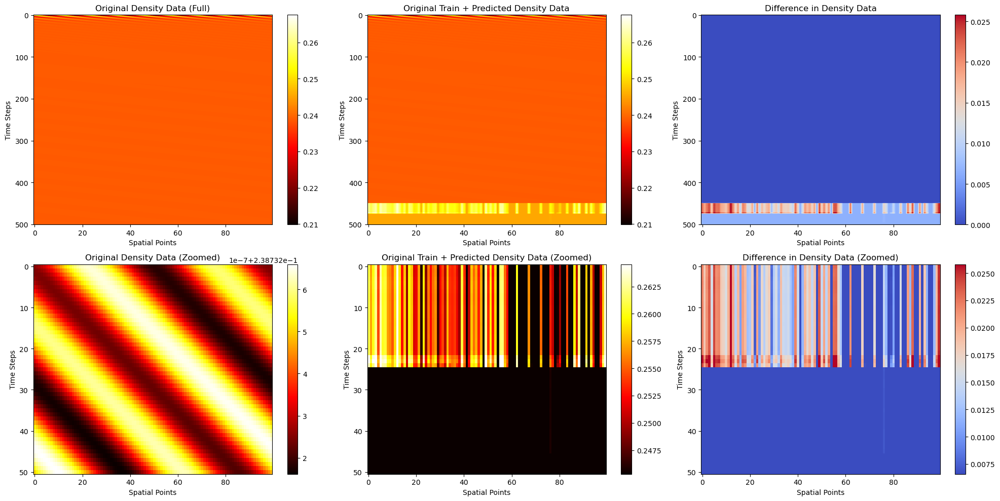

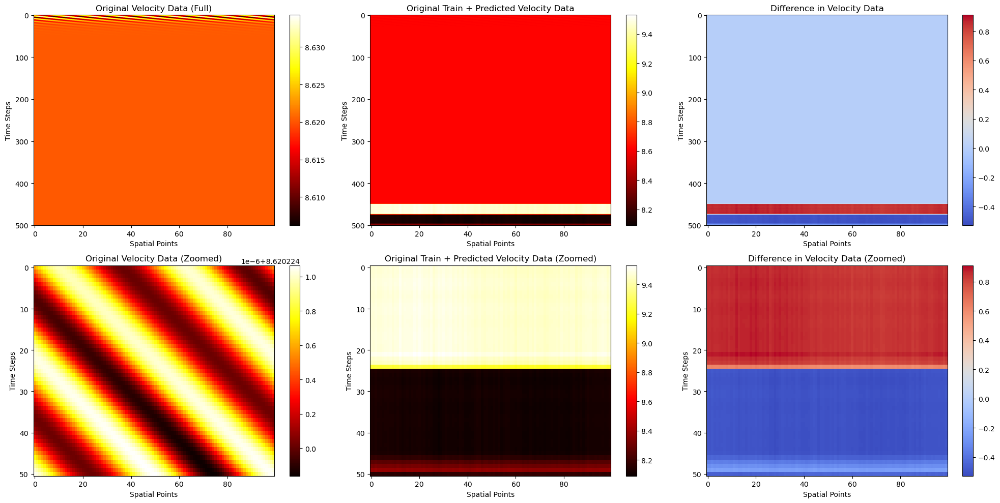

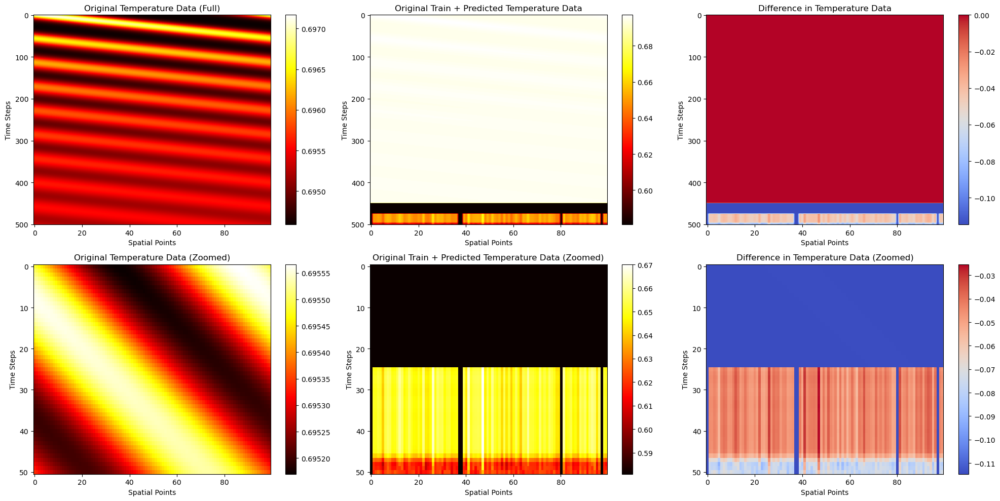

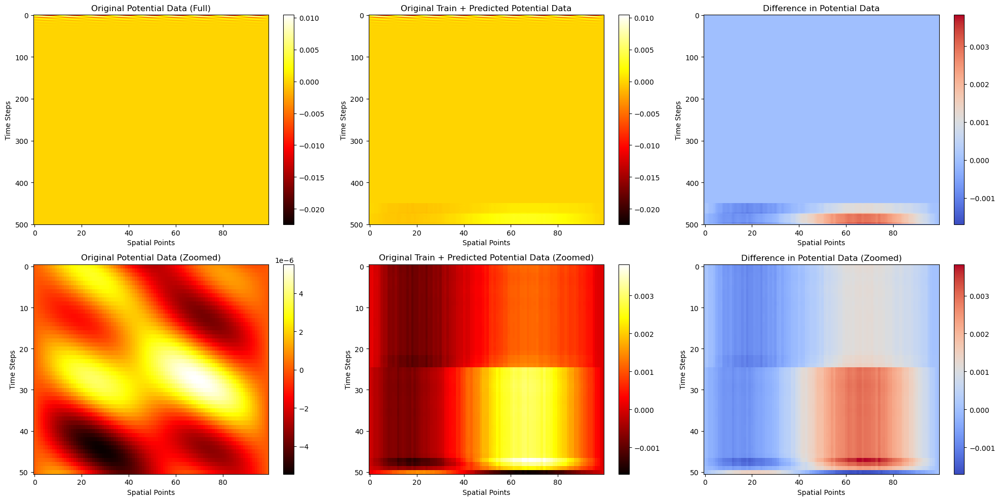

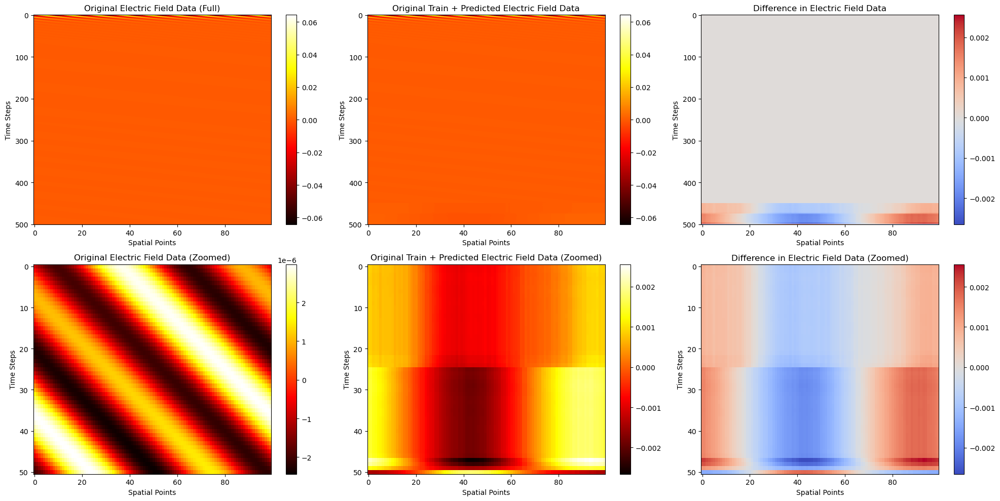

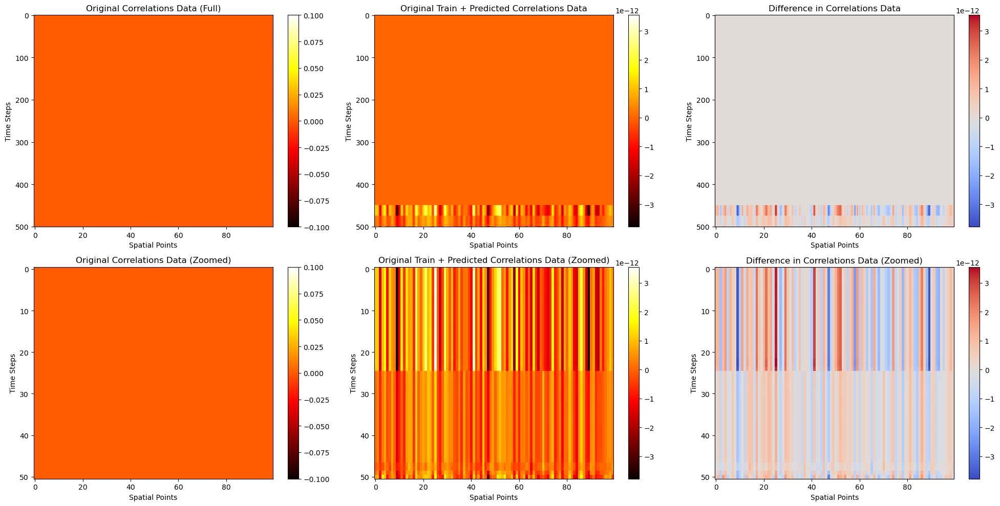

In [54]:
import matplotlib.pyplot as plt

# Forecast future values
sample_idx = 0  # Using the first sample for demonstration
forecast_snaps = num_snaps - train_snaps
initial_sample = training_data[sample_idx]  # Using the first sample for demonstration
current_sequence = np.array([initial_sample[field][:input_timesteps] for field in initial_sample]).transpose((1, 2, 0)).reshape(1, input_timesteps, nx, num_fields)

predicted_snapshots = []

for _ in range(forecast_snaps):
    # Predict the next snapshot
    next_snapshot = model.predict(current_sequence)
    
    # Reshape next_snapshot to match the dimensions of current_sequence
    next_snapshot = next_snapshot.reshape(1, 1, nx, num_fields)
    
    predicted_snapshots.append(next_snapshot)
    
    # Update the current sequence by adding the predicted snapshot and removing the oldest one
    current_sequence = np.concatenate((current_sequence[:, 1:], next_snapshot), axis=1)

predicted_snapshots = np.array(predicted_snapshots).reshape(forecast_snaps, nx, num_fields)

# Undo data normalization
for i, field in enumerate(initial_sample.keys()):
    predicted_snapshots[:, :, i] = predicted_snapshots[:, :, i] * validation_generator.stds[field] + validation_generator.means[field]

# Extract the original snapshots for comparison
original_snapshots = np.array([initial_sample[field] for field in initial_sample]).transpose((1, 2, 0))

# Create the combined original and predicted data for plotting
combined_snapshots = np.concatenate([original_snapshots[:train_snaps], predicted_snapshots], axis=0)

# Plotting heat maps
fields = ['Density', 'Velocity', 'Temperature', 'Potential', 'Electric Field', 'Correlations']
for i, field in enumerate(fields):
    plt.figure(figsize=(20, 10))
    
    # Original data heat map (full)
    plt.subplot(2, 3, 1)
    plt.title(f'Original {field} Data (Full)')
    plt.imshow(original_snapshots[:, :, i], aspect='auto', cmap='hot')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')
    
    # Combined data heat map (train + predicted)
    plt.subplot(2, 3, 2)
    plt.title(f'Original Train + Predicted {field} Data')
    plt.imshow(combined_snapshots[:, :, i], aspect='auto', cmap='hot')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')

    # Difference heat map (train + predicted - original)
    plt.subplot(2, 3, 3)
    plt.title(f'Difference in {field} Data')
    plt.imshow(combined_snapshots[:, :, i] - original_snapshots[:num_snaps, :, i], aspect='auto', cmap='coolwarm')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')

    # Original data heat map (zoomed)
    plt.subplot(2, 3, 4)
    plt.title(f'Original {field} Data (Zoomed)')
    plt.imshow(original_snapshots[-forecast_snaps:, :, i], aspect='auto', cmap='hot')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')
    
    # Combined data heat map (zoomed)
    plt.subplot(2, 3, 5)
    plt.title(f'Original Train + Predicted {field} Data (Zoomed)')
    plt.imshow(combined_snapshots[-forecast_snaps:, :, i], aspect='auto', cmap='hot')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')

    # Difference heat map (zoomed)
    plt.subplot(2, 3, 6)
    plt.title(f'Difference in {field} Data (Zoomed)')
    plt.imshow((combined_snapshots[-forecast_snaps:, :, i] - original_snapshots[-forecast_snaps:, :, i]), aspect='auto', cmap='coolwarm')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')

    plt.tight_layout()
    plt.show()

In [42]:
print(original_snapshots.shape)
print(original_snapshots[:,:,0].shape)

print(original_snapshots[:,:,0])

print(np.sum(original_snapshots[:,:,0]))

(501, 100, 6)
(501, 100)
[[0.25858463 0.24428238 0.22825217 ... 0.25700362 0.26611799 0.26670602]
 [0.2611136  0.25928512 0.2510571  ... 0.23286321 0.24546643 0.25597375]
 [0.24697234 0.25416358 0.25655204 ... 0.22201659 0.22793888 0.23721921]
 ...
 [0.23873259 0.23873261 0.23873262 ... 0.23873252 0.23873254 0.23873257]
 [0.23873255 0.23873257 0.23873259 ... 0.23873247 0.2387325  0.23873252]
 [0.2387325  0.23873253 0.23873256 ... 0.23873242 0.23873245 0.23873248]]
11960.493973355933


In [13]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, CSVLogger
import pickle
import os

def preprocess_data(data_dicts, num_snaps, nx, num_fields, num_past_steps, num_predicted_snapshots):
    """Reorder, normalize, and create sequences for temporal forecasting."""
    num_samples = len(data_dicts)
    
    # Correcting the shape mismatch by determining the actual number of snapshots
    actual_num_snaps = min([sample['Density'].shape[0] for sample in data_dicts]) - 1
    
    # Reorder data to (num_samples, actual_num_snaps, nx, num_fields)
    data = np.zeros((num_samples, actual_num_snaps, nx, num_fields))
    field_names = list(data_dicts[0].keys())
    
    for i, sample in enumerate(data_dicts):
        for j, field in enumerate(field_names):
            data[i, :, :, j] = sample[field][:actual_num_snaps]
    
    # Replace NaNs and infinities with zeroes
    data[np.isnan(data)] = 0
    data[np.isinf(data)] = 0

    # Normalize data
    mean = np.mean(data, axis=(0, 1, 2), keepdims=True)
    std = np.std(data, axis=(0, 1, 2), keepdims=True) + 1e-10 # TODO: Currently correlation std=0 since set to 0. Remove std addition when correlations fixed.
    data_normalized = (data - mean) / std

    # Create sequences
    X, y = [], []
    for sample in data_normalized:
        for i in range(actual_num_snaps - num_past_steps - num_predicted_snapshots + 1):
            X.append(sample[i:i + num_past_steps])
            y.append(sample[i + num_past_steps:i + num_past_steps + num_predicted_snapshots])
    
    X = np.array(X)
    y = np.array(y)
    
    return X, y, mean, std, field_names

def build_model(num_past_steps, nx, num_fields):
    """Build the CNN-LSTM model."""
    model = keras.Sequential([
        # Input layer
        layers.Input(shape=(num_past_steps, nx, num_fields)),
        
        # 1D CNN
        layers.TimeDistributed(layers.Conv1D(32, kernel_size=3, activation='relu', padding='same')),
        
        # 2D CNN
        layers.TimeDistributed(layers.Reshape((nx, 32, 1))),
        layers.TimeDistributed(layers.Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')),
        layers.TimeDistributed(layers.Reshape((nx, -1))),


        # LSTM layers
        layers.LSTM(128, return_sequences=True),
        layers.LSTM(128),
        
        # Dense layer for output
        layers.Dense(nx * num_fields),
        layers.Reshape((1, nx, num_fields)),
        
        # Apply custom activation
        layers.Lambda(lambda x: tf.concat([tf.nn.sigmoid(x[..., 0:1]), tf.nn.relu(x[..., 1:])], axis=-1))
    ])
    
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

def train_model(model, X_train, y_train):
    """Train the model with callbacks."""
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    model_checkpoint = ModelCheckpoint('model.h5', save_best_only=True, monitor='val_loss', mode='min', verbose=1)
    csv_logger = CSVLogger('training_log.csv', append=False)
    
    history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2,
                        callbacks=[reduce_lr, early_stopping, model_checkpoint, csv_logger])
    return history

def forecast_future(model, X_initial, num_future_steps):
    """Forecast future snapshots one step at a time."""
    future_predictions = []
    current_input = X_initial
    
    for _ in range(num_future_steps):
        next_prediction = model.predict(current_input)
        future_predictions.append(next_prediction)
        current_input = np.concatenate([current_input[:, 1:], next_prediction], axis=1)
    
    future_predictions = np.concatenate(future_predictions, axis=1)
    return future_predictions

def reshape_to_original_format(predictions, mean, std, field_names, num_samples):
    """Reshape predictions back to original dictionary format."""
    predictions = predictions * std + mean
    predictions = predictions.reshape(num_samples, -1, predictions.shape[2], len(field_names))
    
    data_dicts = []
    for sample in predictions:
        sample_dict = {field_names[i]: sample[..., i] for i in range(len(field_names))}
        data_dicts.append(sample_dict)
    
    return data_dicts

# Load simulation data
data = np.load("simulation_data.npz", allow_pickle=True)
training_data_dicts = data['training_data'].tolist()
testing_data_dicts = data['testing_data'].tolist()

# Preprocess data
num_snaps = 500
nx = 100
num_fields = 6
num_past_steps = 20
num_predicted_snapshots = 1

X_train, y_train, mean, std, field_names = preprocess_data(training_data_dicts, num_snaps, nx, num_fields, num_past_steps, num_predicted_snapshots)

# Build and train model
model = build_model(num_past_steps, nx, num_fields)
history = train_model(model, X_train, y_train)

# Forecast future snapshots
num_future_steps = 50
X_initial = X_train[-1].reshape(1, num_past_steps, nx, num_fields)  # Use the last training sequence as the initial input
future_predictions = forecast_future(model, X_initial, num_future_steps)

# Reshape predictions back to original format
predicted_data_dicts = reshape_to_original_format(future_predictions, mean, std, field_names, len(testing_data_dicts))

ValueError: Input 0 of layer "lstm_12" is incompatible with the layer: expected ndim=3, found ndim=4. Full shape received: (None, 20, 100, 2048)

In [9]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ConvLSTM2D, Dense, Flatten, TimeDistributed, Reshape

# Parameters
nx = 100  # Number of spatial points

# Build the model
model = Sequential()
model.add(ConvLSTM2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same', return_sequences=True,
                     input_shape=(input_timesteps, nx, 1, num_fields)))
model.add(ConvLSTM2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model.add(TimeDistributed(Flatten()))
model.add(Dense(nx * num_fields))
model.add(Reshape((nx, num_fields)))

model.compile(optimizer='adam', loss='mse')

model.summary()

ValueError: Exception encountered when calling layer "reshape_1" (type Reshape).

total size of new array must be unchanged, input_shape = [100, 600], output_shape = [100, 6]

Call arguments received by layer "reshape_1" (type Reshape):
  • inputs=tf.Tensor(shape=(None, 100, 600), dtype=float32)

In [5]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

x = layers.ConvLSTM2D(kernel_size=(3,3), filters='linear')

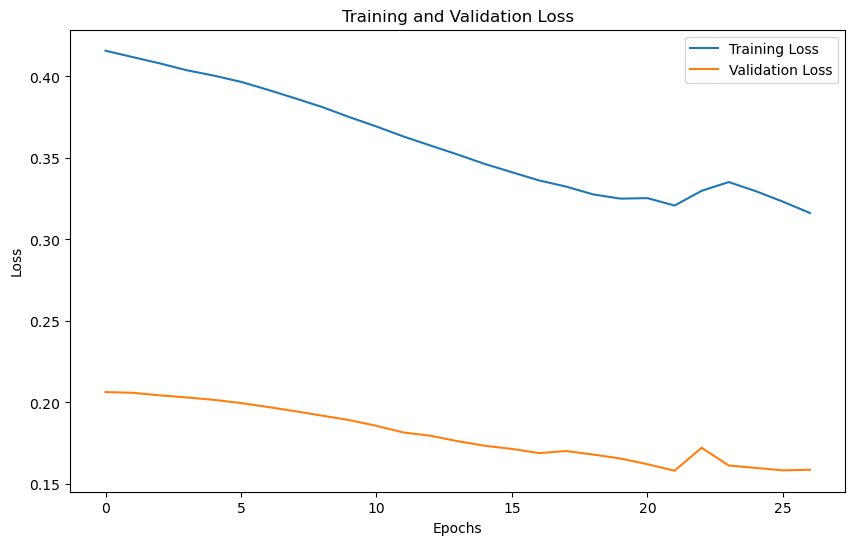

4/4 [==============================] - 1s 248ms/step


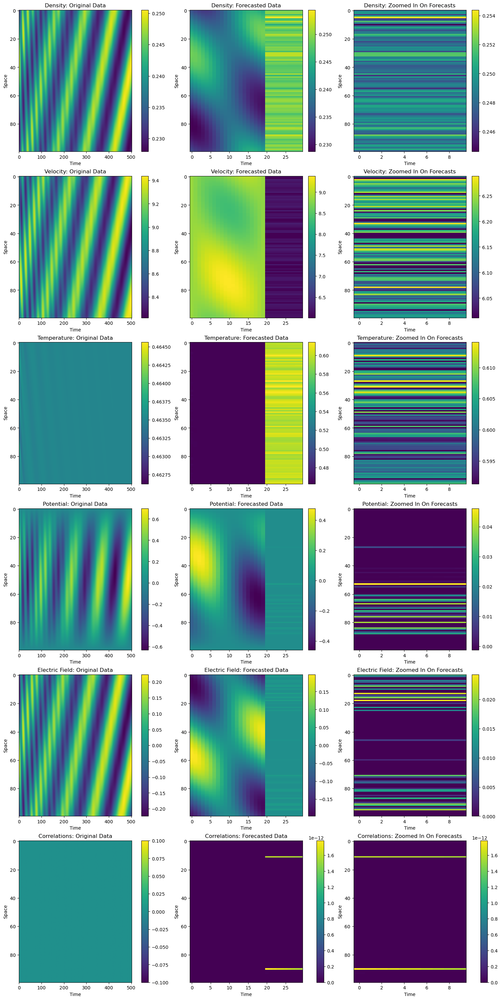

In [ ]:
# Visualize training history
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# One step ahead forecast
def forecast_snapshots(model, initial_data, future_snapshots, num_fields, num_points):
    output_data = np.zeros((initial_data.shape[0], initial_data.shape[1] + future_snapshots, num_points, num_fields))
    output_data[:, :initial_data.shape[1], :, :] = initial_data

    for i in range(future_snapshots):
        new_input = output_data[:, -train_snaps:, :, :]
        next_snapshot = model.predict(new_input)
        output_data[:, initial_data.shape[1] + i, :, :] = next_snapshot[:, :, :]

    return output_data

future_snapshots = 10
forecasted_data_normalized = forecast_snapshots(model, X_test, future_snapshots, X_train.shape[-1], X_train.shape[2])
forecasted_data = forecasted_data_normalized * std + mean

# Visualize model predictions
instance_idx = 0
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15, 30), constrained_layout=True)
fields = ['Density', 'Velocity', 'Temperature', 'Potential', 'Electric Field', 'Correlations']

for i, field in enumerate(fields):
    ax = axes[i, 0]
    cax = ax.imshow(testing_fields[instance_idx, :, :, i].T, aspect='auto')
    fig.colorbar(cax, ax=ax)
    ax.set_title(f'{field}: Original Data')
    ax.set_xlabel('Time')
    ax.set_ylabel('Space')

    ax = axes[i, 1]
    cax = ax.imshow(forecasted_data[instance_idx, :, :, i].T, aspect='auto')
    fig.colorbar(cax, ax=ax)
    ax.set_title(f'{field}: Forecasted Data')
    ax.set_xlabel('Time')
    ax.set_ylabel('Space')

    ax = axes[i, 2]
    cax = ax.imshow(forecasted_data[instance_idx, -future_snapshots:, :, i].T, aspect='auto')
    fig.colorbar(cax, ax=ax)
    ax.set_title(f'{field}: Zoomed In On Forecasts')
    ax.set_xlabel('Time')
    ax.set_ylabel('Space')

plt.show()

In [20]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, LSTM, Dense, TimeDistributed, Flatten
from sklearn.model_selection import train_test_split

# Load data
data = np.load("simulation_data.npz", allow_pickle=True)
training_data = data['training_data']

# Parameters
num_samples = len(training_data)
num_snaps = training_data[0]['Density'].shape[0]
nx = training_data[0]['Density'].shape[1]
input_timesteps = 20  # Using 20 past snapshots to predict the next one

# Prepare input-output pairs
X = []
y = []

for sample in training_data:
    for i in range(num_snaps - input_timesteps):
        X.append([sample[field][i:i+input_timesteps] for field in sample])
        y.append([sample[field][i+input_timesteps] for field in sample])

# Convert lists to numpy arrays and reshape
X = np.array(X).transpose((0, 2, 3, 1))  # Shape: (num_samples * (num_snaps - input_timesteps), input_timesteps, nx, num_fields)
y = np.array(y).transpose((0, 2, 1))  # Shape: (num_samples * (num_snaps - input_timesteps), nx, num_fields)

# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training data shape: {X_train.shape}, Training labels shape: {y_train.shape}")
print(f"Validation data shape: {X_val.shape}, Validation labels shape: {y_val.shape}")

Training data shape: (38560, 20, 100, 6), Training labels shape: (38560, 100, 6)
Validation data shape: (9640, 20, 100, 6), Validation labels shape: (9640, 100, 6)


In [24]:
# Build the model
model = Sequential()
model.add(TimeDistributed(Conv1D(filters=64, kernel_size=3, activation='relu', padding='same'), input_shape=(input_timesteps, nx, len(training_data[0]))))
model.add(TimeDistributed(Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')))
model.add(TimeDistributed(Flatten()))

model.add(LSTM(100, activation='relu'))
model.add(Dense(600, activation='relu'))  # 100 * 6 fields flattened
model.add(Dense(nx * len(training_data[0])))  # Predicting all fields
model.add(tf.keras.layers.Reshape((nx, len(training_data[0]))))  # Reshape to (nx, num_fields)

model.compile(optimizer='adam', loss='mse')

model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_30 (TimeDi  (None, 20, 100, 64)      1216      
 stributed)                                                      
                                                                 
 time_distributed_31 (TimeDi  (None, 20, 100, 64)      12352     
 stributed)                                                      
                                                                 
 time_distributed_32 (TimeDi  (None, 20, 6400)         0         
 stributed)                                                      
                                                                 
 lstm_15 (LSTM)              (None, 100)               2600400   
                                                                 
 dense_9 (Dense)             (None, 600)               60600     
                                                      

In [26]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, CSVLogger, ModelCheckpoint

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6, verbose=1)
csv_logger = CSVLogger('training_log.csv')
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True)

# Train the model with callbacks
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_val, y_val), 
                    callbacks=[early_stopping, reduce_lr, csv_logger, model_checkpoint], verbose=1)

# Save the final model
model.save(model_file_name)


Epoch 1/50
1205/1205 [==============================] - 147s 122ms/step - loss: 0.0099 - val_loss: 0.0073 - lr: 0.0010
Epoch 2/50
1205/1205 [==============================] - 130s 108ms/step - loss: 0.0073 - val_loss: 0.0048 - lr: 0.0010
Epoch 3/50
1205/1205 [==============================] - 159s 132ms/step - loss: 0.0060 - val_loss: 0.0054 - lr: 0.0010
Epoch 4/50
1205/1205 [==============================] - 251s 208ms/step - loss: 0.0058 - val_loss: 0.0051 - lr: 0.0010
Epoch 5/50
1205/1205 [==============================] - 129s 107ms/step - loss: 0.0035 - val_loss: 0.0039 - lr: 5.0000e-04
Epoch 6/50
1205/1205 [==============================] - 173s 143ms/step - loss: 0.0037 - val_loss: 0.0036 - lr: 5.0000e-04
Epoch 7/50
1205/1205 [==============================] - 128s 106ms/step - loss: 0.0034 - val_loss: 0.0049 - lr: 5.0000e-04
Epoch 8/50
1205/1205 [==============================] - 127s 105ms/step - loss: 0.0032 - val_loss: 0.0033 - lr: 5.0000e-04
Epoch 9/50
1205/1205 [==========

1/1 [==============================] - 0s 20ms/step


ValueError: operands could not be broadcast together with shapes (51,100) (100,51) 

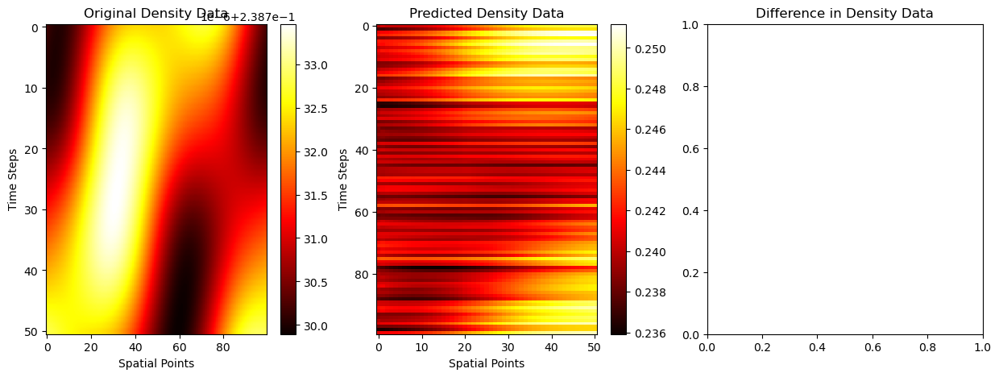

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Load the model
model = tf.keras.models.load_model(model_file_name)

# Parameters
input_timesteps = 20
nx = 100
num_fields = 6

# Use the last 20 snapshots from the training data to predict the next 51 snapshots
initial_sequence = training_data[0]  # Using the first sample for simplicity
current_sequence = np.array([[initial_sequence[field][:input_timesteps] for field in initial_sequence]]).transpose((0, 2, 3, 1))

predicted_snapshots = []

for _ in range(51):
    # Predict the next snapshot
    next_snapshot = model.predict(current_sequence)
    predicted_snapshots.append(next_snapshot)
    
    # Update the current sequence by adding the predicted snapshot and removing the oldest one
    current_sequence = np.concatenate((current_sequence[:, 1:], next_snapshot[:, np.newaxis, :, :]), axis=1)

predicted_snapshots = np.array(predicted_snapshots).reshape(51, nx, num_fields)

# Convert predicted_snapshots to the same format as original data for comparison
predicted_snapshots = predicted_snapshots.transpose((1, 0, 2))

# Extract the original snapshots for comparison
original_snapshots = np.array([initial_sequence[field][-51:] for field in initial_sequence]).transpose((1, 2, 0))

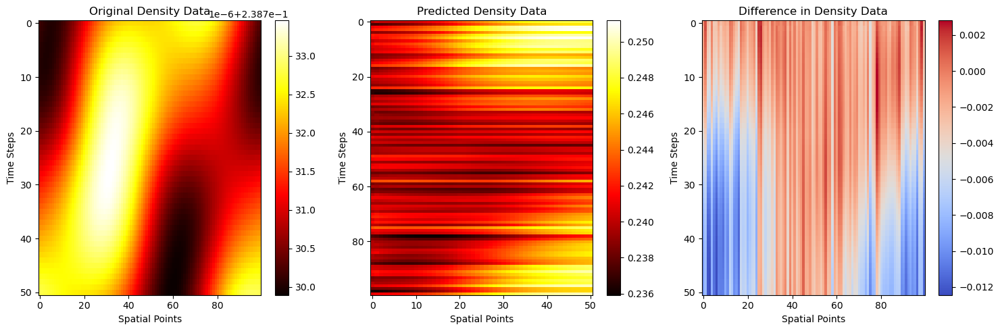

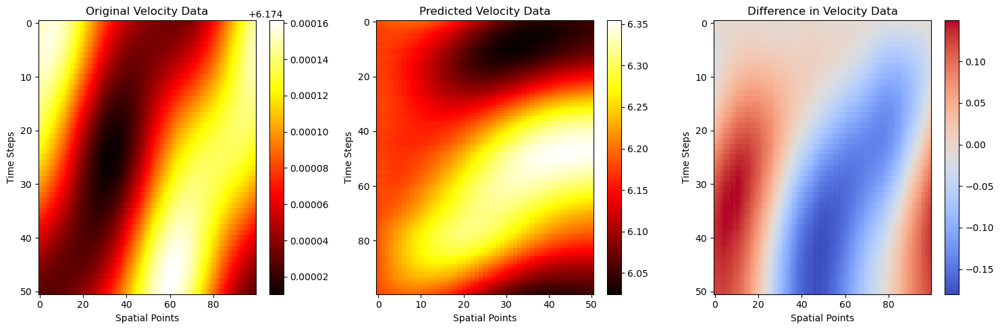

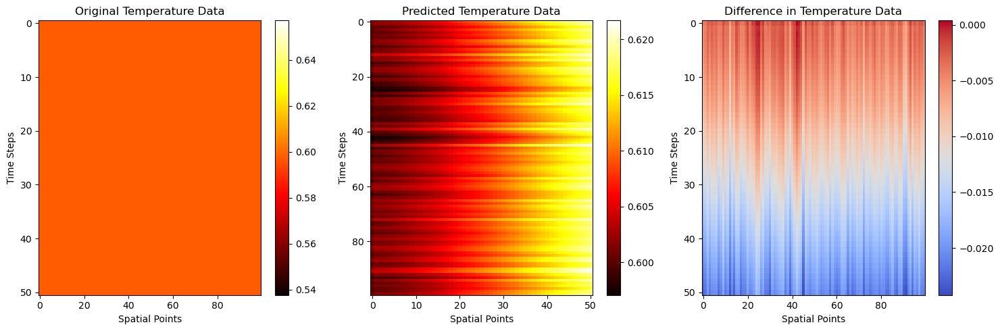

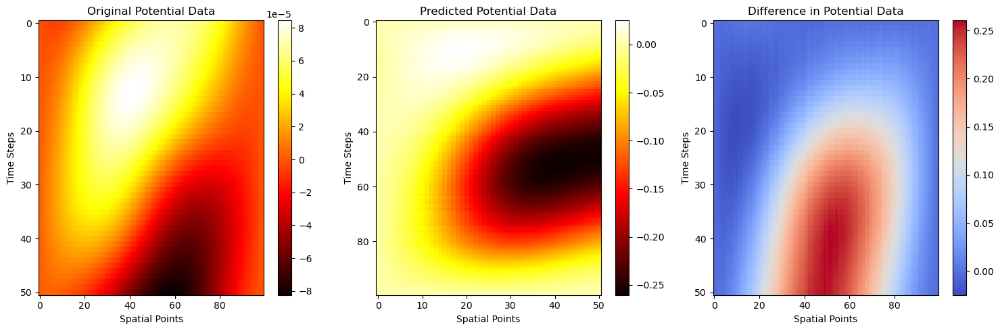

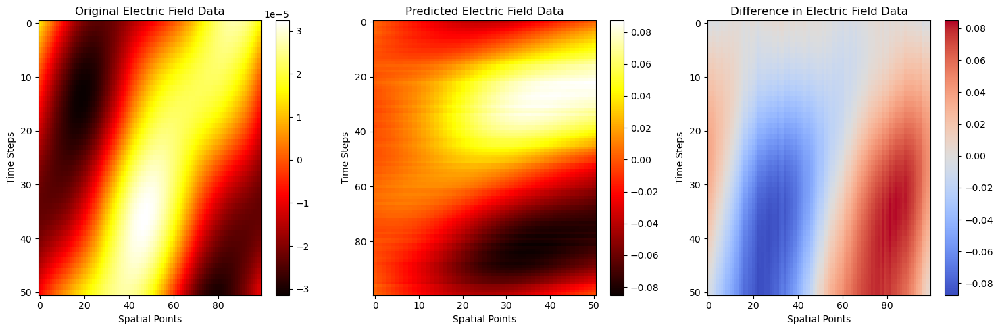

...

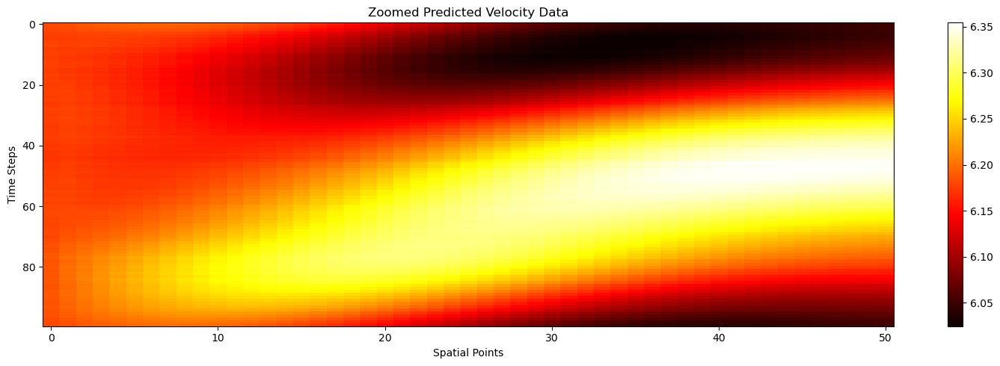

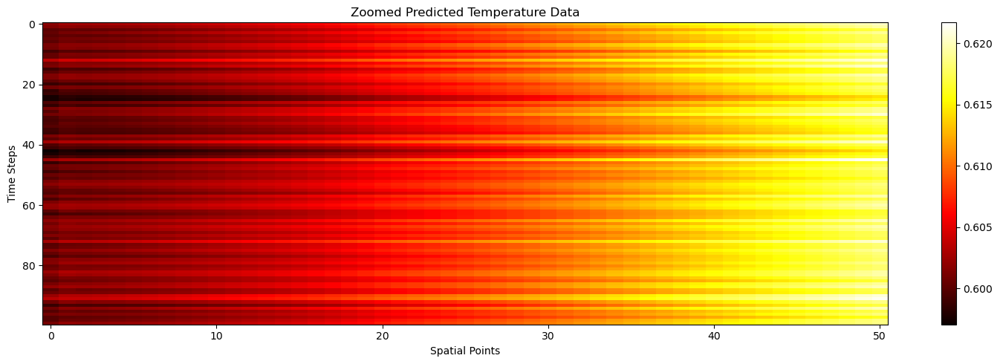

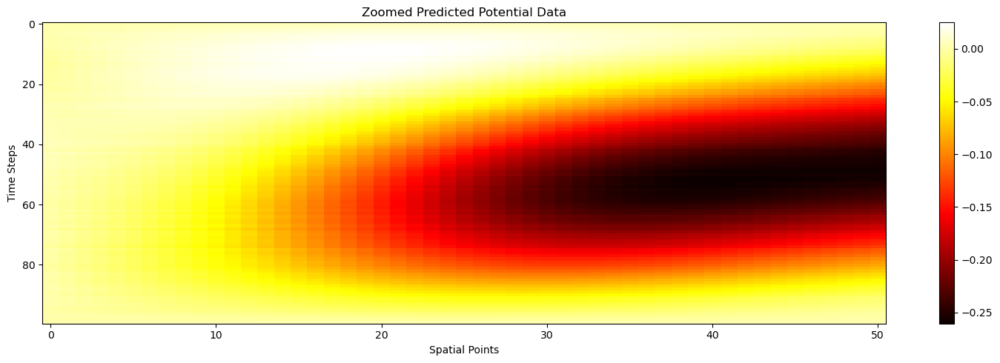

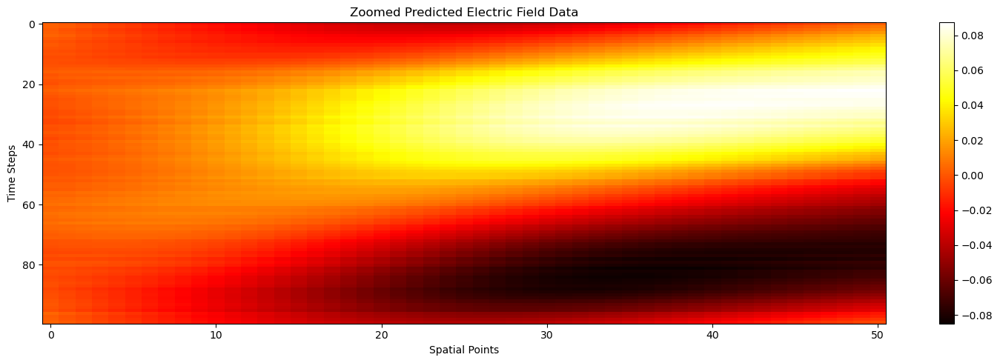

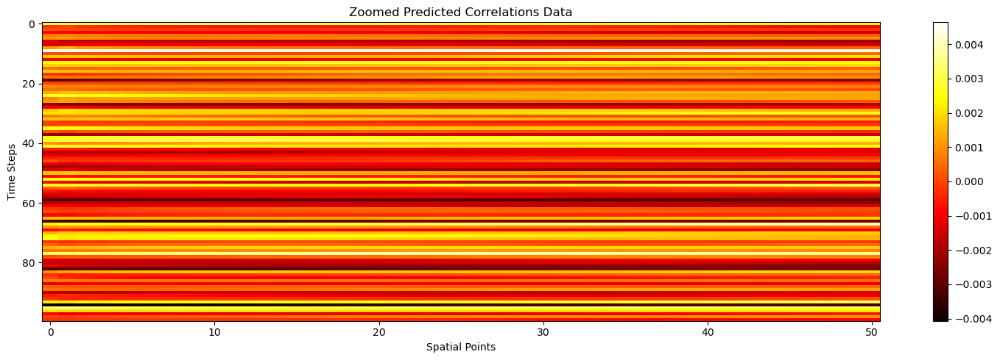

In [31]:
# Plotting heat maps
fields = ['Density', 'Velocity', 'Temperature', 'Potential', 'Electric Field', 'Correlations']
for i, field in enumerate(fields):
    plt.figure(figsize=(15, 5))
    
    # Original data heat map
    plt.subplot(1, 3, 1)
    plt.title(f'Original {field} Data')
    plt.imshow(original_snapshots[:, :, i], aspect='auto', cmap='hot')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')
    
    # Predicted data heat map
    plt.subplot(1, 3, 2)
    plt.title(f'Predicted {field} Data')
    plt.imshow(predicted_snapshots[:, :, i], aspect='auto', cmap='hot')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')
    
    # Difference heat map
    plt.subplot(1, 3, 3)
    plt.title(f'Difference in {field} Data')
    plt.imshow(original_snapshots[:, :, i] - predicted_snapshots[:, :, i].T, aspect='auto', cmap='coolwarm')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')
    
    plt.tight_layout()
    plt.show()

# Zoomed-in version for just the predicted snapshots
for i, field in enumerate(fields):
    plt.figure(figsize=(15, 5))
    
    # Predicted data heat map (Zoomed)
    plt.title(f'Zoomed Predicted {field} Data')
    plt.imshow(predicted_snapshots[:, :, i], aspect='auto', cmap='hot')
    plt.colorbar()
    plt.xlabel('Spatial Points')
    plt.ylabel('Time Steps')
    
    plt.tight_layout()
    plt.show()

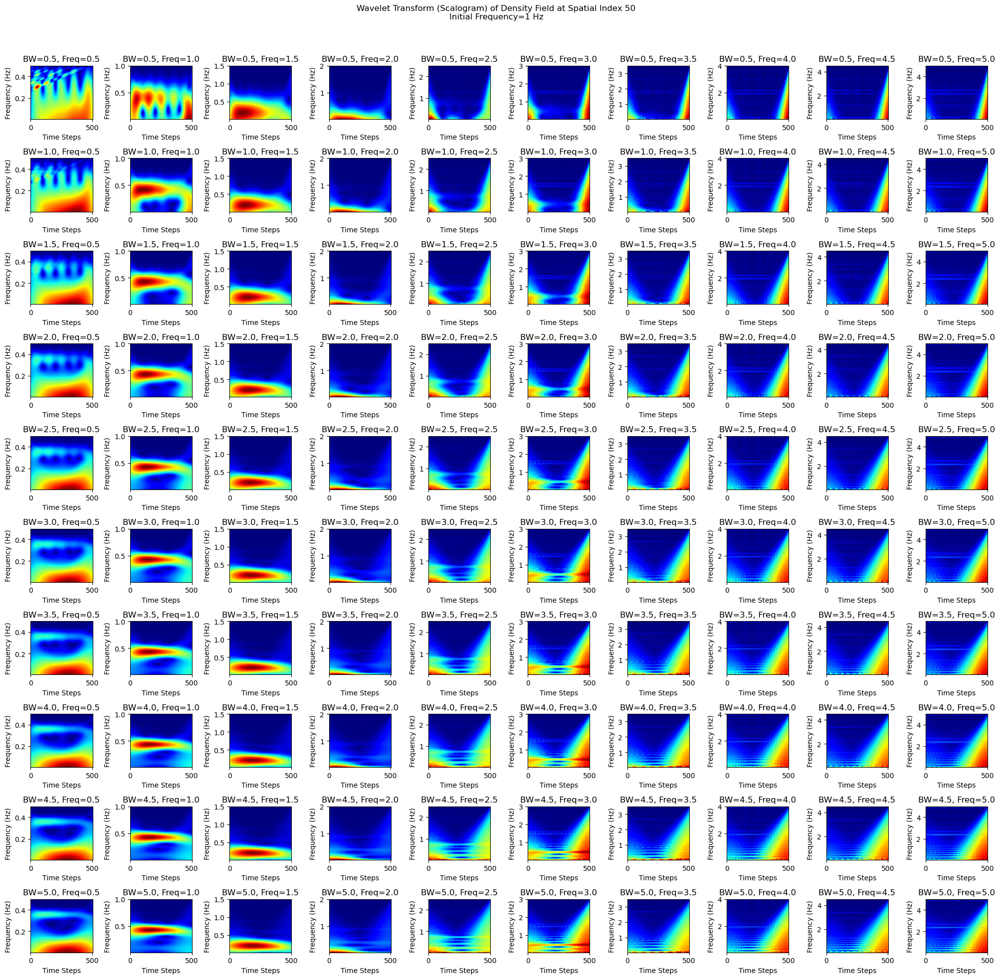

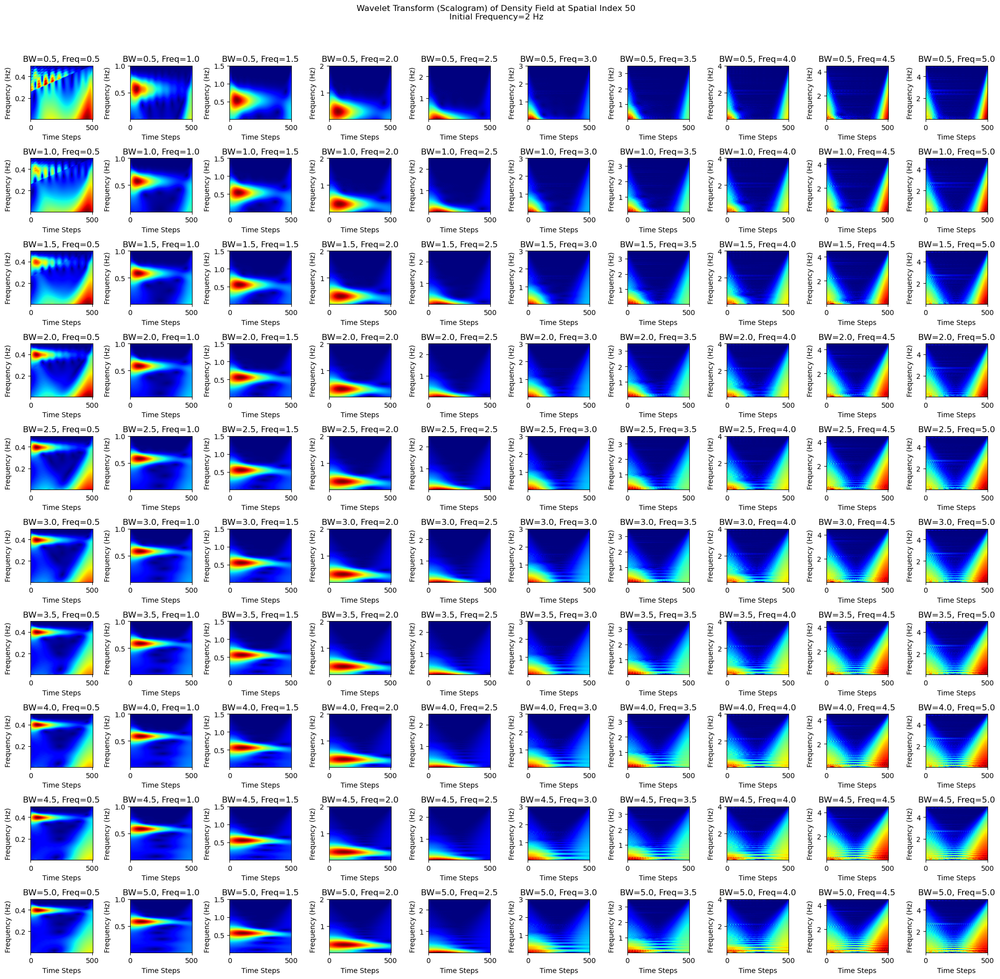

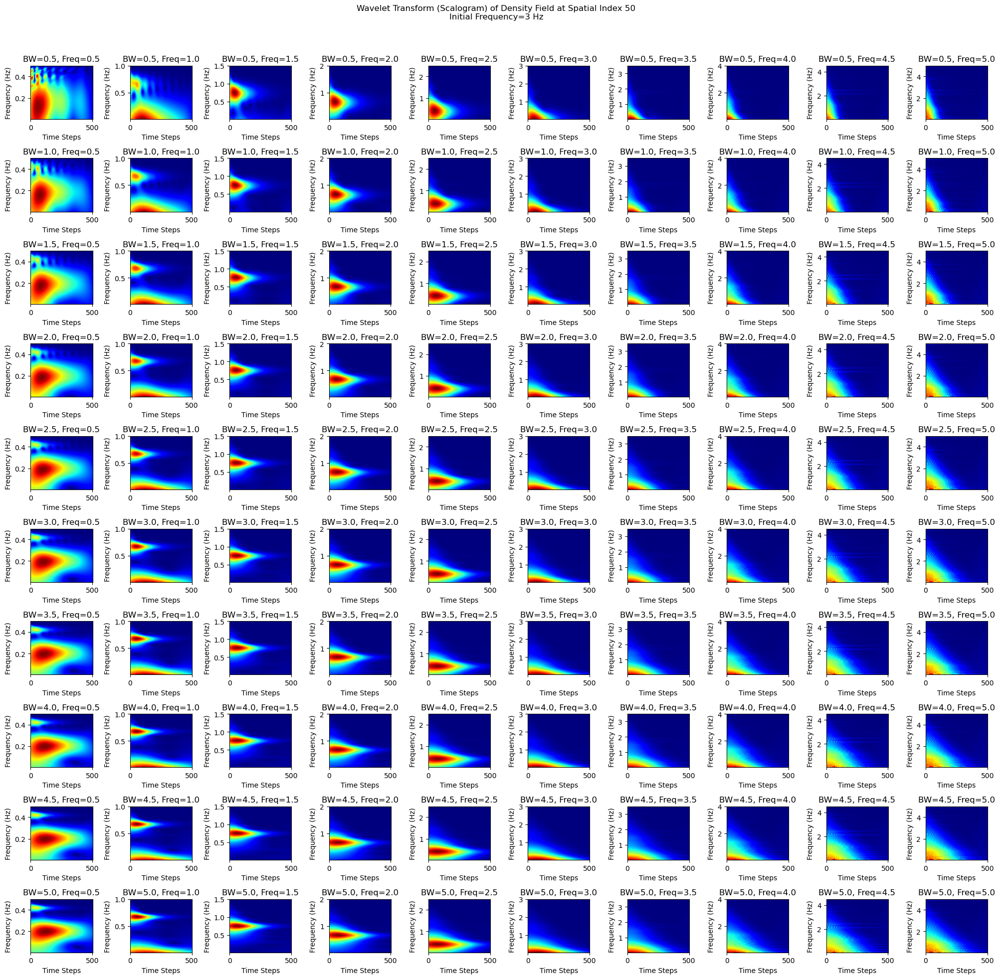

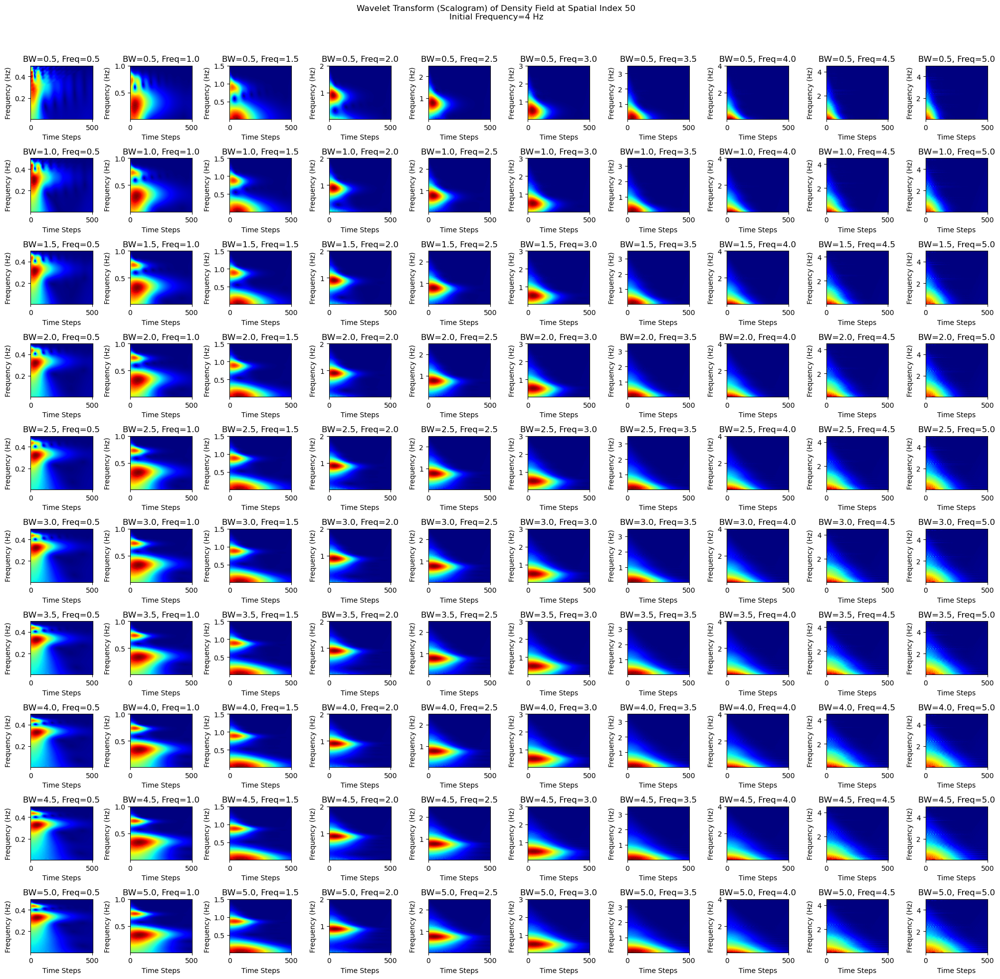

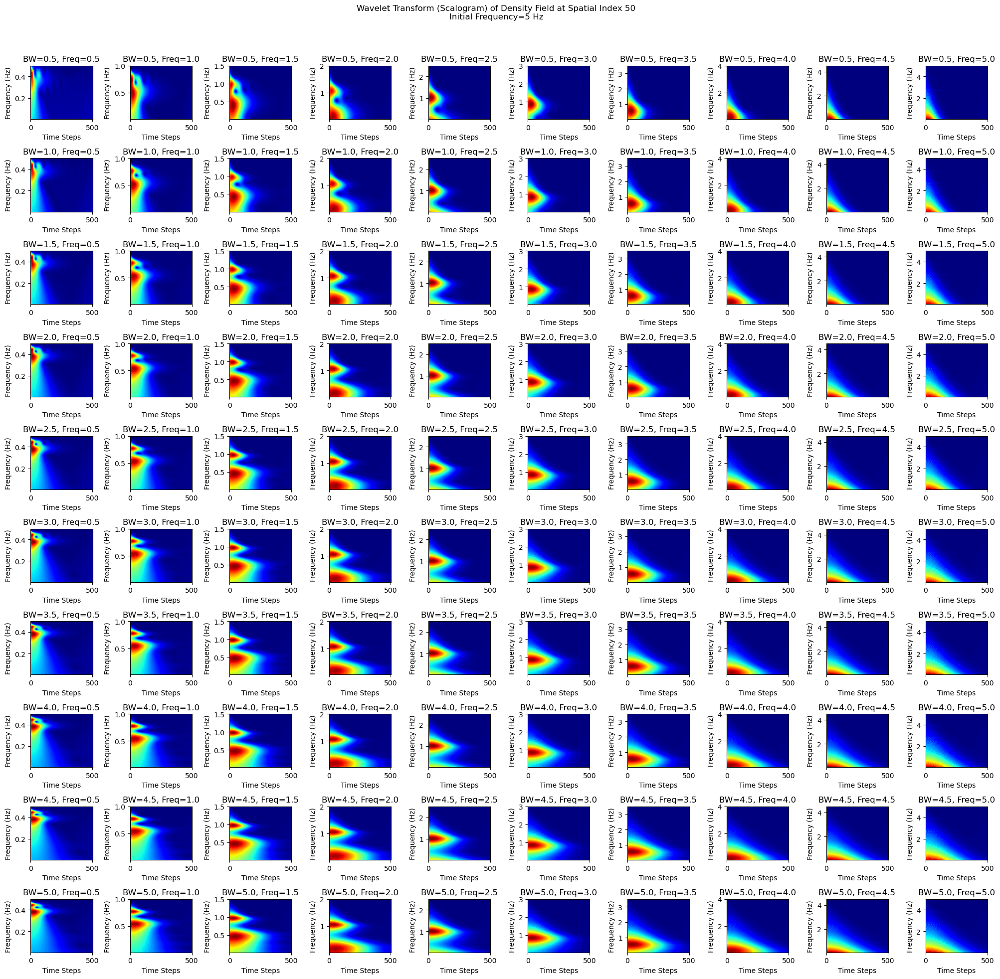

In [39]:
import numpy as np
import pywt
import matplotlib.pyplot as plt

# Shift to Left
def l(array):
    return np.roll(array, 1, axis=-1)

# Shift to Right
def r(array):
    return np.roll(array, -1, axis=-1)

# Derivative
def ddx(array, dx):    
    return (array - l(array)) / dx

# Second Derivative
def d2dx2(array, dx):
    return (r(array) - 2 * array + l(array)) / (dx * dx)

# Save Snap
def snapshot(fields, fieldConservations, n, u, T, Φ, C, cur_snap, dx, X):
    fields["Density"][cur_snap] = n
    fields["Velocity"][cur_snap] = u
    fields["Temperature"][cur_snap] = T
    fields["Potential"][cur_snap] = Φ
    fields["Electric Field"][cur_snap] = -ddx(Φ, dx)
    fields["Correlations"][cur_snap] = C

    fieldConservations["Density Integral"][cur_snap] = np.trapz(n, X)
    fieldConservations["Velocity Integral"][cur_snap] = np.trapz(u, X)
    fieldConservations["Temperature Integral"][cur_snap] = np.trapz(T, X)
    fieldConservations["Potential Sum"][cur_snap] = np.sum(Φ)
    fieldConservations["Electric Field Sum"][cur_snap] = np.sum(-ddx(Φ, dx))
    fieldConservations["Electric Field Integral"][cur_snap] = np.trapz(-ddx(Φ, dx), X)
    fieldConservations["Correlations Sum"][cur_snap] = np.sum(C)
    fieldConservations["Correlations Integral"][cur_snap] = np.trapz(C, X)

def solve_poisson(nx, n, dx):
    """
    Solves the Poisson equation with periodic boundary conditions using a special Thomas algorithm.
    """
    mean_n = np.mean(n)
    ρ = -4 * np.pi * (n - mean_n) * dx**2

    # Step 1: Compute potential at mesh point 0
    Φ = np.zeros(nx)
    Φ[0] = np.sum((np.arange(1, nx + 1) * ρ)) / nx

    # Step 2: Compute potential at mesh point 1
    Φ[1] = ρ[0] + 2 * Φ[0]

    # Step 3: Compute remaining potentials
    for i in range(2, nx):
        Φ[i] = ρ[i - 1] + 2 * Φ[i - 1] - Φ[i - 2]

    return Φ

# Spatial Domain
nx = int(1e2)
L = 10
dx = L / nx
X = np.linspace(0, L, nx, endpoint=False)

# Temporal Domain
end_time = 5
num_snaps = 500
snap_interval = end_time / num_snaps

# Parameters
mean_n = 3 / (4*np.pi)
Γ = 10
κ = 2
therm_cond = 0.01
cfl_safety = 0.1

# Memory Allocation for Fields
fields = {
    "Density": np.empty((num_snaps+1, nx)),
    "Velocity": np.empty((num_snaps+1, nx)),
    "Temperature": np.empty((num_snaps+1, nx)),
    "Potential": np.empty((num_snaps+1, nx)),
    "Electric Field": np.empty((num_snaps+1, nx)),
    "Correlations": np.empty((num_snaps+1, nx))
}

# Conservation checks
fieldConservations = {
    "Density Integral": np.empty(num_snaps+1),
    "Velocity Integral": np.empty(num_snaps+1),
    "Temperature Integral": np.empty(num_snaps+1), 
    "Potential Sum": np.empty(num_snaps+1),
    "Electric Field Sum": np.empty(num_snaps+1), 
    "Electric Field Integral": np.empty(num_snaps+1),
    "Correlations Sum": np.empty(num_snaps+1),
    "Correlations Integral": np.empty(num_snaps+1)
}

# Perform Wavelet Transformation
def perform_wavelet_analysis(signal, wavelet_name, scales):
    coefficients, frequencies = pywt.cwt(signal, scales, wavelet_name)
    return coefficients, frequencies

# Define a range of parameters for the Complex Morlet wavelet
bandwidth_values = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0]
frequency_values = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0]

# Function to perform wavelet analysis and visualize results
def perform_and_visualize_wavelet(signal, wavelet_name, scales, space_index, bandwidth, frequency, ax):
    coefficients, frequencies = perform_wavelet_analysis(signal, wavelet_name, scales)
    
    ax.imshow(np.abs(coefficients), extent=[0, len(signal), frequencies[-1], frequencies[0]], cmap='jet', aspect='auto')
    ax.set_title(f'BW={bandwidth}, Freq={frequency}')
    ax.set_xlabel('Time Steps')
    ax.set_ylabel('Frequency (Hz)')

# Function to run the full hydrodynamic simulation and wavelet analysis
def run_simulation_with_frequency(frequency):
    # Define initial conditions with a specific frequency
    n = mean_n + 0.01 * np.sin(2 * np.pi * frequency * X / L)
    u = 5 * np.ones_like(X) + 0.01 * np.sin(2 * np.pi * frequency * X / L)
    T = np.ones_like(X) + 0.01 * np.sin(2 * np.pi * frequency * X / L)
    Φ = solve_poisson(nx, n, dx)
    C = np.zeros_like(X)  # TODO: Add Correlations

    # Memory Allocation for Fields
    fields = {
        "Density": np.empty((num_snaps+1, nx)),
        "Velocity": np.empty((num_snaps+1, nx)),
        "Temperature": np.empty((num_snaps+1, nx)),
        "Potential": np.empty((num_snaps+1, nx)),
        "Electric Field": np.empty((num_snaps+1, nx)),
        "Correlations": np.empty((num_snaps+1, nx))
    }

    # Save Initial Snapshot
    snapshot(fields, fieldConservations, n, u, T, Φ, C, 0, dx, X)
    cur_snap = 1
    t = 0

    # Time Integration
    while t < end_time:
        max_field_speed = np.max(np.array([np.abs(u).max()]))
        dt = cfl_safety * dx / max_field_speed
        next_snap_time = cur_snap * snap_interval
        if t + dt >= next_snap_time:
            dt = next_snap_time - t  # Adjust dt to exactly reach the snapshot time

        # Update fields
        Φ = solve_poisson(nx, n, dx)  # Solve Poisson Equation
        n -= dt * ddx(n * u, dx)
        u -= dt * (u * ddx(u, dx) - T * ddx(n, dx) / n + Γ * T * ddx(Φ, dx))
        T -= dt * (u * ddx(T, dx) - d2dx2(therm_cond * T, dx))
        t += dt

        if t >= next_snap_time:
            snapshot(fields, fieldConservations, n, u, T, Φ, C, cur_snap, dx, X)
            cur_snap += 1

    # Perform Wavelet Transformation
    space_index = 50  # Use the time series at a specific spatial index for wavelet analysis
    signal = fields["Density"][:, space_index]
    signal_normalized = (signal - np.mean(signal)) / np.std(signal)

    # Plot the subplots for each frequency of initial condition
    fig, axes = plt.subplots(len(bandwidth_values), len(frequency_values), figsize=(20, 20))
    fig.suptitle(f'Wavelet Transform (Scalogram) of Density Field at Spatial Index {space_index}\nInitial Frequency={frequency} Hz')

    for i, bandwidth in enumerate(bandwidth_values):
        for j, central_frequency in enumerate(frequency_values):
            wavelet_name = f'cmor{bandwidth}-{central_frequency}'
            perform_and_visualize_wavelet(signal_normalized, wavelet_name, np.arange(1, 128), space_index, bandwidth, central_frequency, axes[i, j])

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# List of initial frequencies to run simulations
initial_frequencies = [1, 2, 3, 4, 5]

# Run the simulation for each initial frequency
for frequency in initial_frequencies:
    run_simulation_with_frequency(frequency)